In [24]:
import rasterio as rio
from rasterio.plot import show
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib import colors

In [25]:
def summarize_image(image, channel_names = None):

    num_channels = image.shape[0]
    if channel_names and len(channel_names) != num_channels:
        raise ValueError("O número de nomes dos canais não corresponde ao número de canais na imagem.")
    
    if not channel_names:
        channel_names = [f'Channel {i}' for i in range(num_channels)]
    
    # Inicializar um DataFrame vazio para armazenar os resumos
    summary_df = pd.DataFrame()

    # Processar cada canal
    for i, channel_name in enumerate(channel_names):
        # Extrair o canal específico e achatar para um vetor
        channel_data = image[i, :, :].ravel()
        
        # Converter o numpy array para um pandas Series
        data_series = pd.Series(channel_data)
        
        # Obter o resumo estatístico para o canal
        summary = data_series.describe()
        
        # Adicionar uma coluna para o resumo do canal específico
        summary_df[channel_name] = summary

    return summary_df



In [26]:
def realce(img, percent_i=2, percent_f=98, x=0 , y=1):
    
    w = np.percentile(img, percent_i)
    z = np.percentile(img, percent_f)
    
            
    # Calcular a expansão
    s = np.clip(x + (img - w) * (y - x) / (z - w), x, y)
    
    return s
     

In [27]:
image_path = "G:/Meu Drive/INPE/projeto_dissertacao/imagem_testes_rec.TIF"

In [28]:
matplotlib.rcParams['figure.figsize'] = (12,6)
     

In [29]:
with rio.open(image_path) as src:
    image = src.read() #*2.75e-5  -0.2 
    affine = src.transform  
    profile = src.profile  

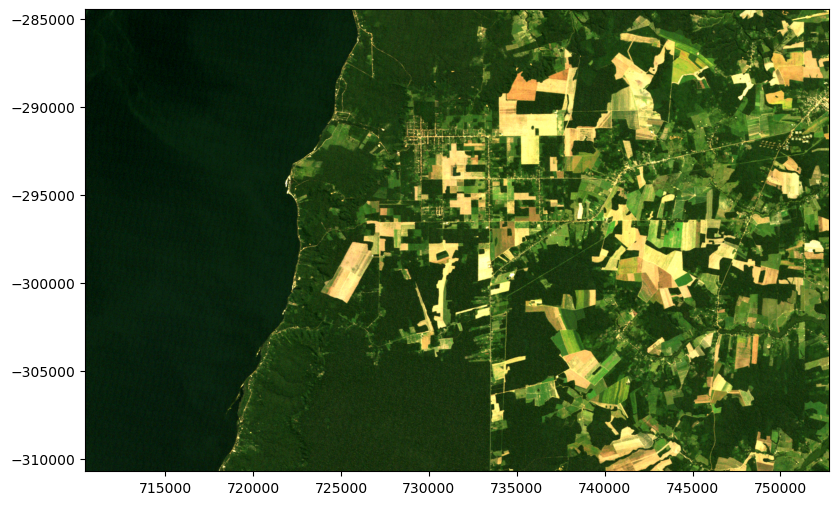

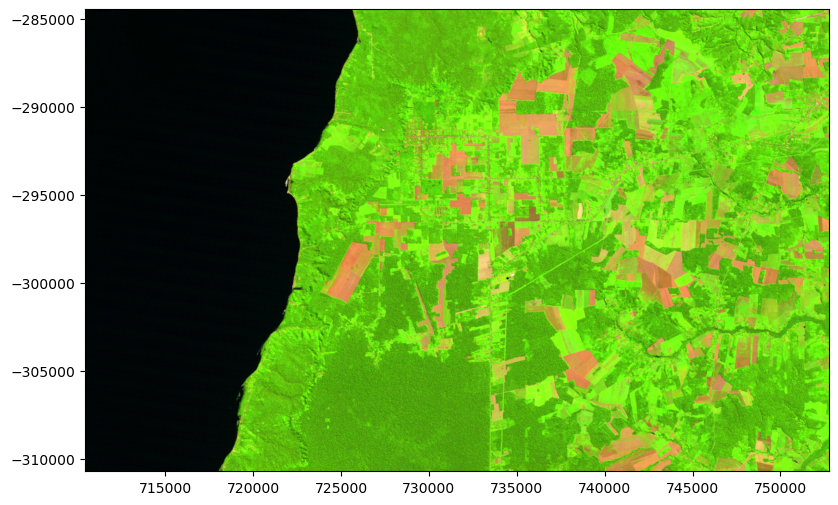

<Axes: >

In [38]:
show(realce(image[[2, 1, 0],:,:]), transform=affine, adjust=True)
show(realce(image[[4, 3, 2],:,:]), transform=affine, adjust=True)

Correção de ruídos

In [253]:
image_noise = image.copy()

In [254]:
image_noise[:,:,800:802]= 0

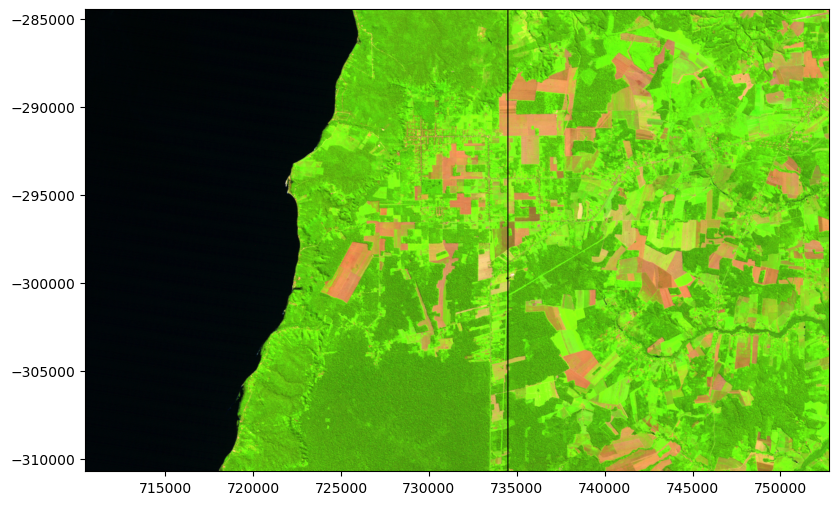

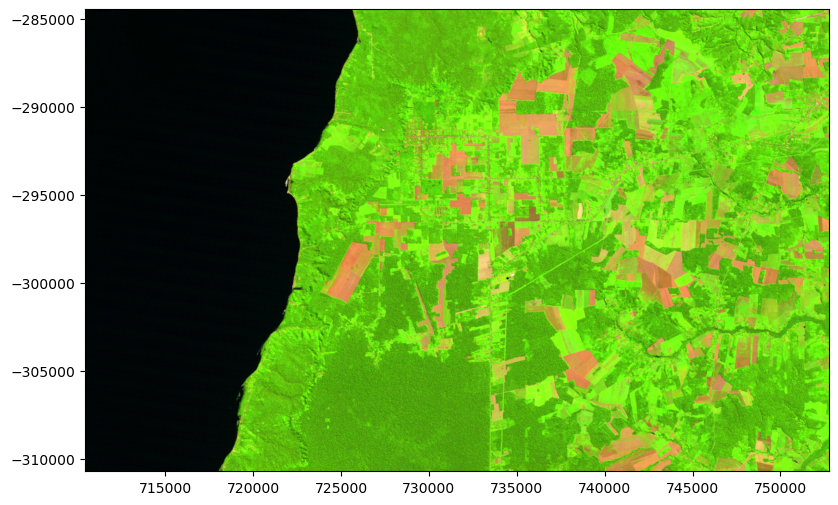

<Axes: >

In [255]:
show(realce(image_noise[[4, 3, 2],:,:]), transform=affine, adjust=True)
show(realce(image[[4, 3, 2],:,:]), transform=affine, adjust=True)

In [259]:
img_denoise = ndimage.median_filter(image_noise, size = (1,5,5))


In [252]:
help(ndimage.median_filter)

Help on function median_filter in module scipy.ndimage._filters:

median_filter(input, size=None, footprint=None, output=None, mode='reflect', cval=0.0, origin=0, *, axes=None)
    Calculate a multidimensional median filter.
    
    Parameters
    ----------
    input : array_like
        The input array.
    size : scalar or tuple, optional
        See footprint, below. Ignored if footprint is given.
    footprint : array, optional
        Either `size` or `footprint` must be defined. `size` gives
        the shape that is taken from the input array, at every element
        position, to define the input to the filter function.
        `footprint` is a boolean array that specifies (implicitly) a
        shape, but also which of the elements within this shape will get
        passed to the filter function. Thus ``size=(n,m)`` is equivalent
        to ``footprint=np.ones((n,m))``.  We adjust `size` to the number
        of dimensions of the input array, so that, if the input array is
 

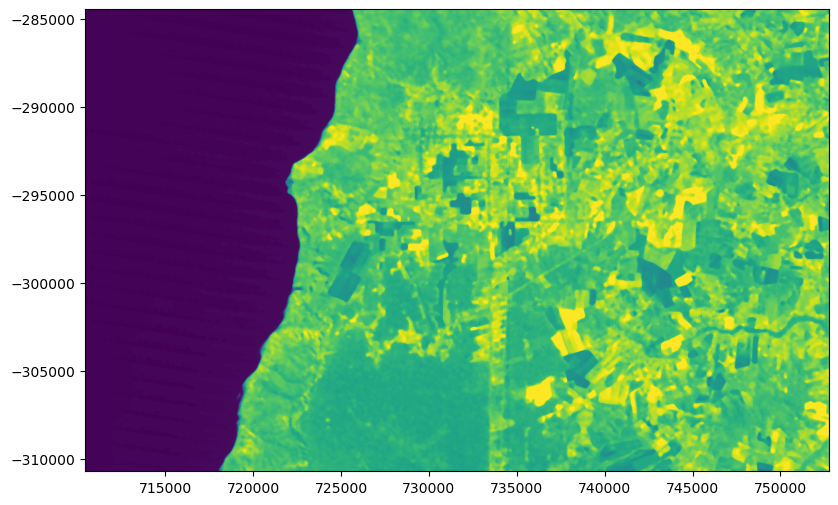

<Axes: >

In [251]:
show(realce(img_denoise), transform=affine, adjust=True)

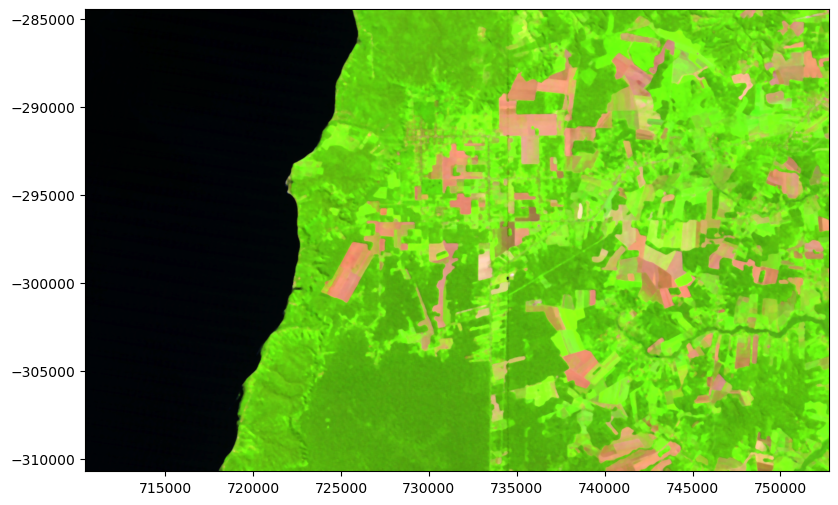

<Axes: >

In [260]:
show(realce(img_denoise[[4, 3, 2],:,:]), transform=affine, adjust=True)

Quais as bandas ópticas do Landsat-5/TM?

In [53]:
channel_names = ['BLUE','GREEN', 'RED', 'NIR', 'SWIR1','SWIR2']

In [54]:
summarize_image(image, channel_names)

,BLUE,GREEN,RED,NIR,SWIR1,SWIR2
count,1.236036e+06,1.236036e+06,1.236036e+06,1.236036e+06,1.236036e+06,1.236036e+06
mean,8.138379e+03,8.882981e+03,8.568585e+03,1.554356e+04,1.206884e+04,9.361010e+03
std,4.736567e+02,8.748651e+02,1.143887e+03,5.202488e+03,3.535417e+03,1.944218e+03
min,7.384000e+03,7.602000e+03,7.432000e+03,7.182000e+03,6.893000e+03,6.903000e+03
25%,7.874000e+03,8.284000e+03,7.871000e+03,7.814000e+03,7.421000e+03,7.500000e+03
50%,7.968000e+03,8.604000e+03,8.147000e+03,1.742200e+04,1.238200e+04,9.124000e+03
75%,8.171000e+03,9.216000e+03,8.615000e+03,1.913000e+04,1.393300e+04,9.864000e+03
max,2.023800e+04,2.299900e+04,2.435700e+04,3.386500e+04,2.832600e+04,2.738600e+04


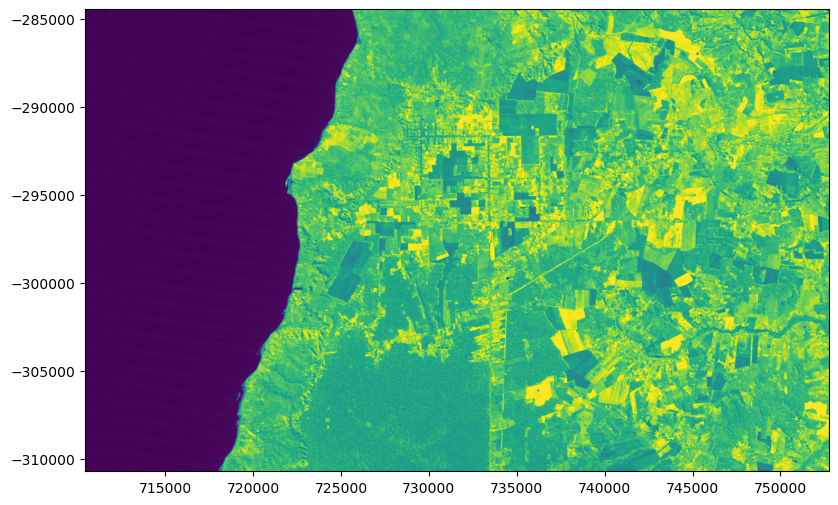

<Axes: >

In [59]:
show(realce(image[3,:,:]), transform=affine, adjust=True)

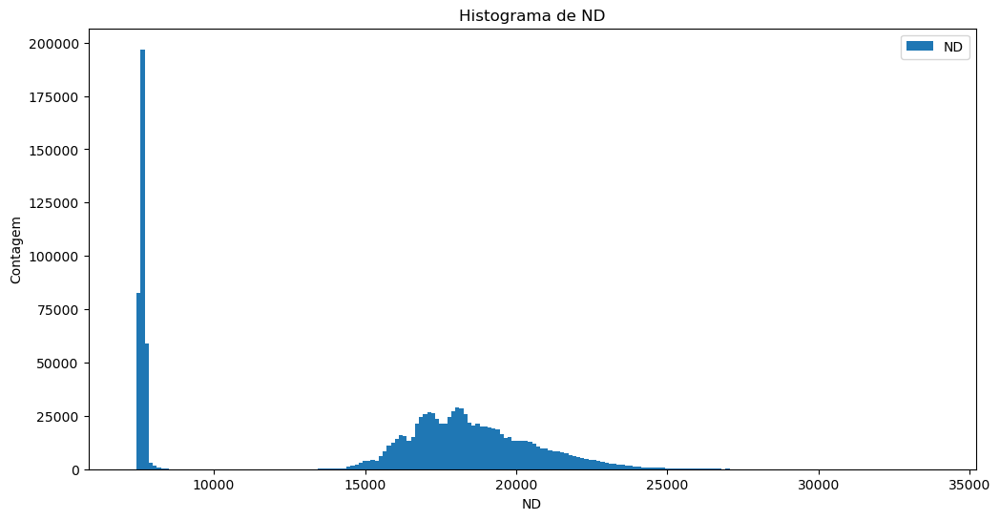

In [62]:
plt.hist(image[3,:,:].ravel(),bins= 200,histtype='stepfilled', label = 'ND')
# Adicionar legendas e títulos
plt.xlabel('ND')
plt.ylabel('Contagem')
plt.legend()
plt.title('Histograma de ND')
plt.show()

In [63]:
img_agua_hist = image[3,:,:]<10000

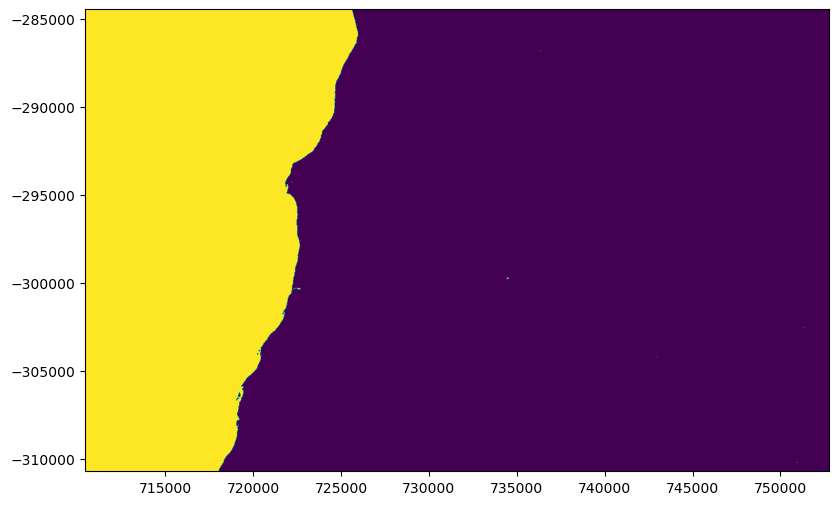

<Axes: >

In [64]:
show(img_agua_hist, transform=affine, adjust=True)

Como poderíamos extrair os corpos d'água da imagem?

In [68]:
RED = image[2,:,:]
NIR = image[3,:,:]

In [65]:
NDWI = (image[1]-image[3])/(image[1]+ image[3])

In [70]:
NDVI = (NIR -RED)/(NIR+RED)

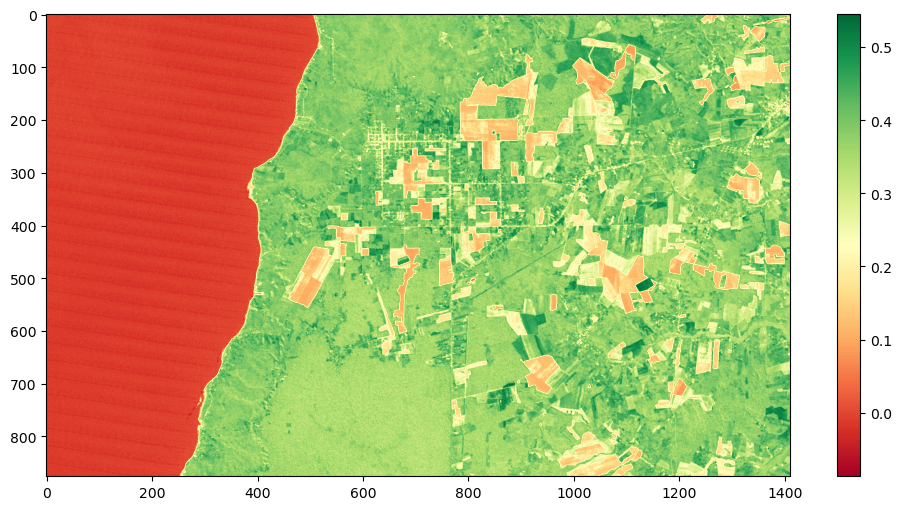

In [72]:
plt.imshow(NDVI, cmap='RdYlGn')
plt.colorbar()

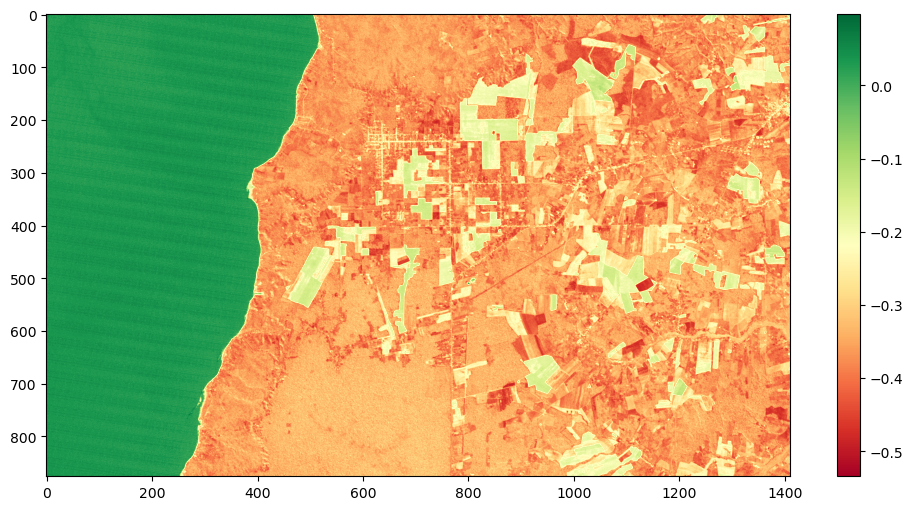

In [66]:
plt.imshow(NDWI, cmap='RdYlGn')
plt.colorbar()

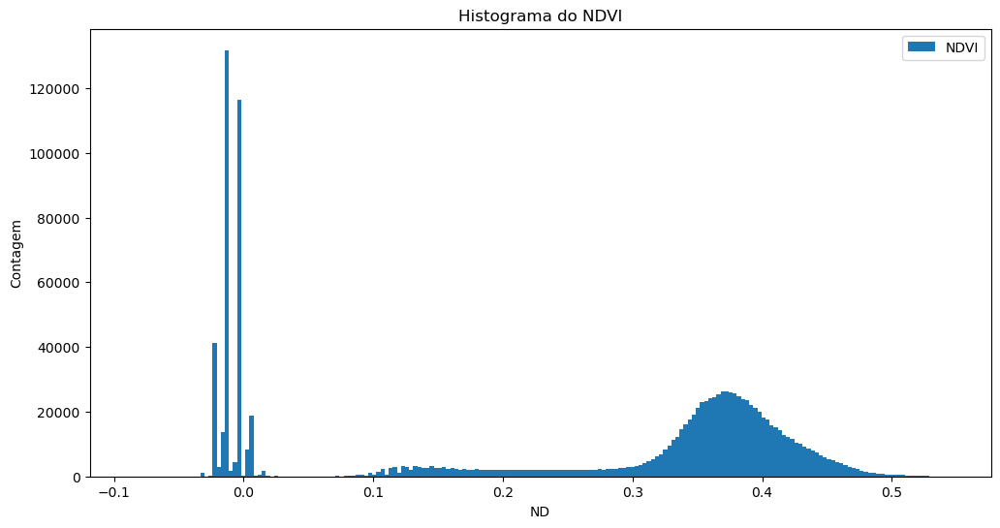

In [74]:
plt.hist(NDVI.ravel(),bins= 200,histtype='stepfilled', label = 'NDVI')
# Adicionar legendas e títulos
plt.xlabel('ND')
plt.ylabel('Contagem')
plt.legend()
plt.title('Histograma do NDVI')
plt.show()

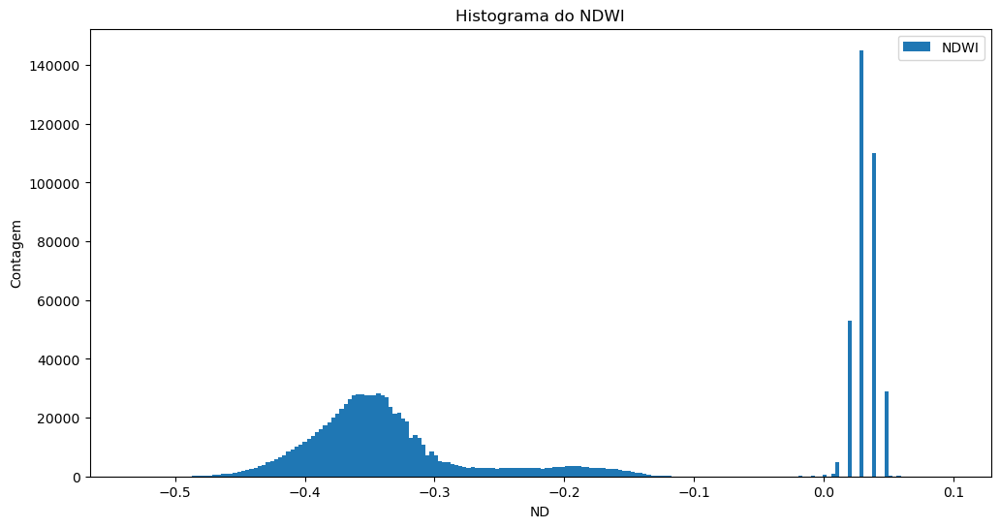

In [75]:
plt.hist(NDWI.ravel(),bins= 200,histtype='stepfilled', label = 'NDWI')
# Adicionar legendas e títulos
plt.xlabel('ND')
plt.ylabel('Contagem')
plt.legend()
plt.title('Histograma do NDWI')
plt.show()

In [76]:
img_agua = NDWI>0

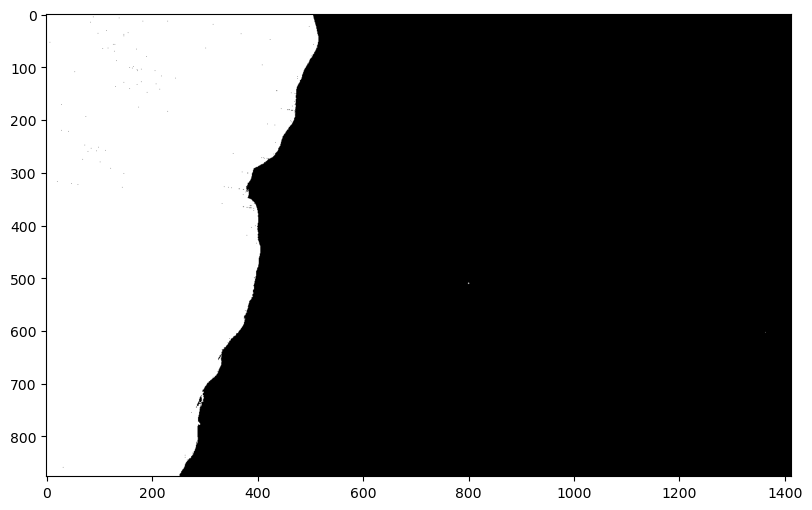

In [77]:
plt.imshow(img_agua,cmap='binary_r')

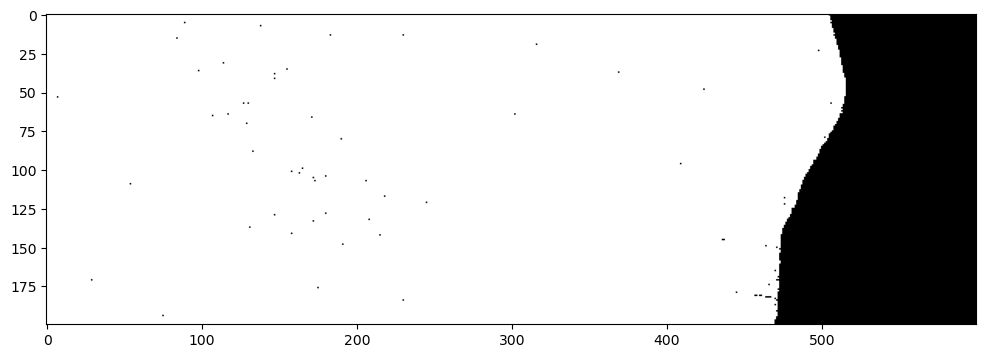

In [78]:
plt.imshow(img_agua[:200,:600],cmap='binary_r')

Como remover esses ruídos?

In [79]:
from scipy import ndimage

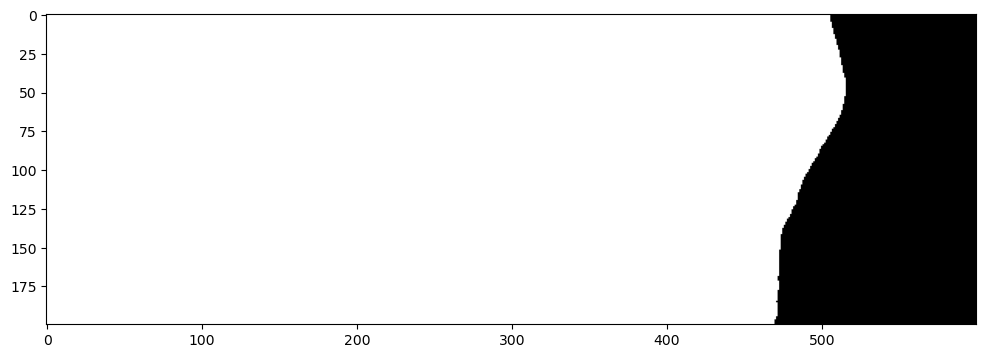

In [80]:
filtered_img = ndimage.median_filter(img_agua, size = 5)
plt.imshow(filtered_img [:200,:600],cmap='binary_r')

Como posso extrair a borda?

In [81]:
kernel = np.array([[-1,-1,-1],[-1,8,-1], [-1,-1,-1]
                   ])

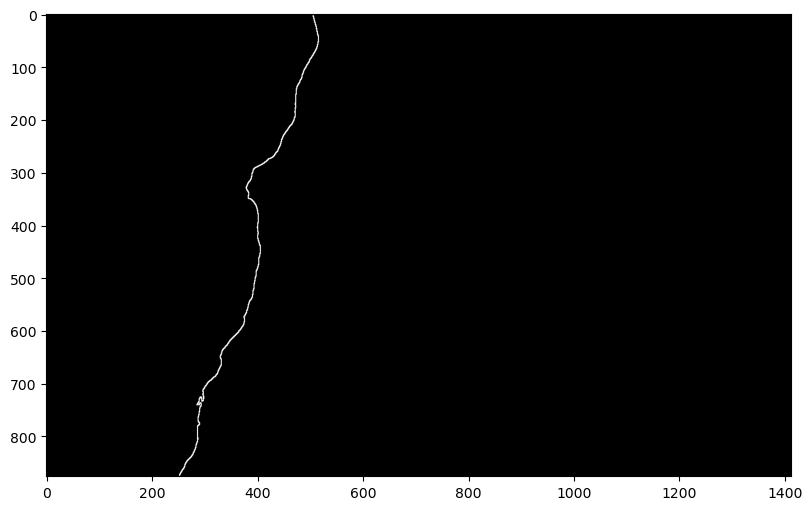

In [82]:
bordas = ndimage.convolve(filtered_img,kernel)
plt.imshow(bordas,cmap='binary_r')

Detecção de mudanças - Diferença

In [92]:
image_path2  = "G:/Meu Drive/INPE/projeto_dissertacao/imagem_testes_2_rec.TIF"

In [93]:
with rio.open(image_path2) as src2:
    image2 = src2.read() #*2.75e-5  -0.2 
    affine2 = src2.transform  
    profile2 = src2.profile  

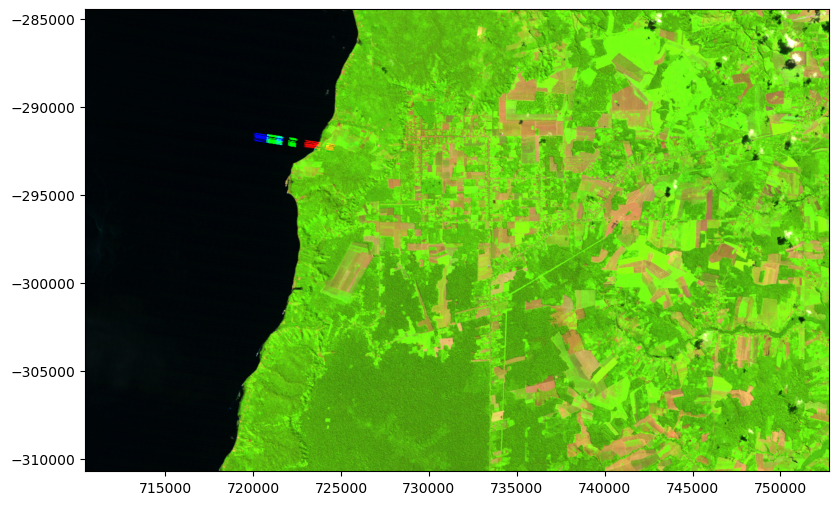

<Axes: >

In [94]:
show(realce(image2[[4, 3, 2],:,:]), transform=affine2, adjust=True)

In [95]:
ndvi_2005 = (image2[3,:,:] - image2[2,:,:])/(image2[3,:,:] + image2[2,:,:] + 0.00000001) 
ndvi_2010 = (image[3,:,:] - image[2,:,:])/(image[3,:,:] + image[2,:,:] + 0.00000001)

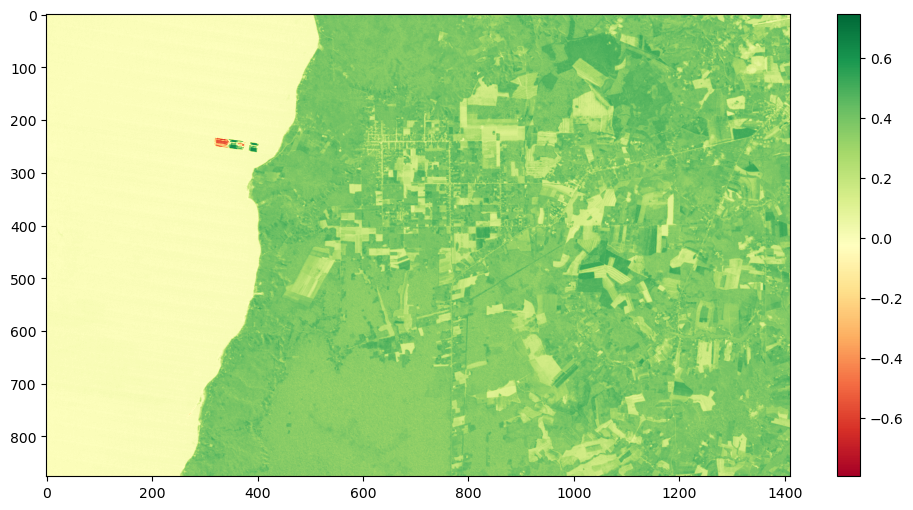

In [96]:
plt.imshow(ndvi_2005, cmap='RdYlGn')
plt.colorbar()

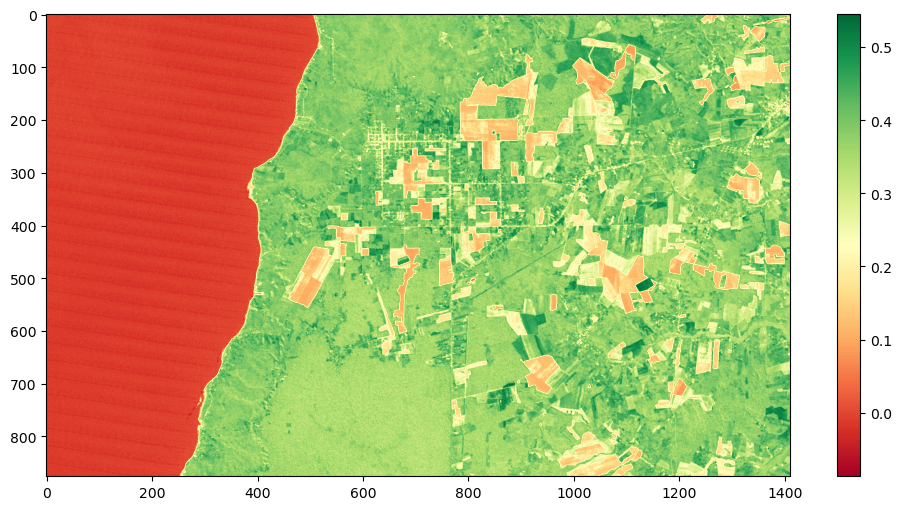

In [97]:
plt.imshow(ndvi_2010, cmap='RdYlGn')
plt.colorbar()

In [98]:
image_diff = ndvi_2005 - ndvi_2010

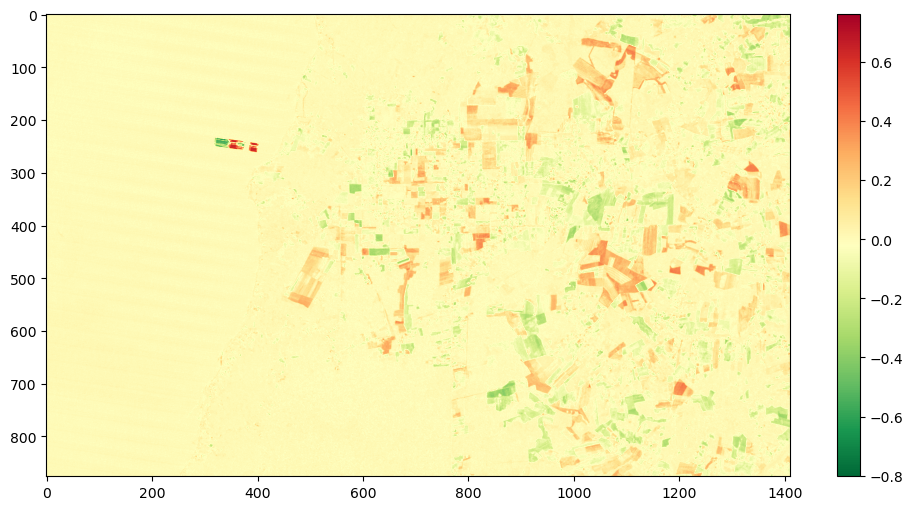

In [108]:
plt.imshow(image_diff , cmap='RdYlGn_r')
plt.colorbar()

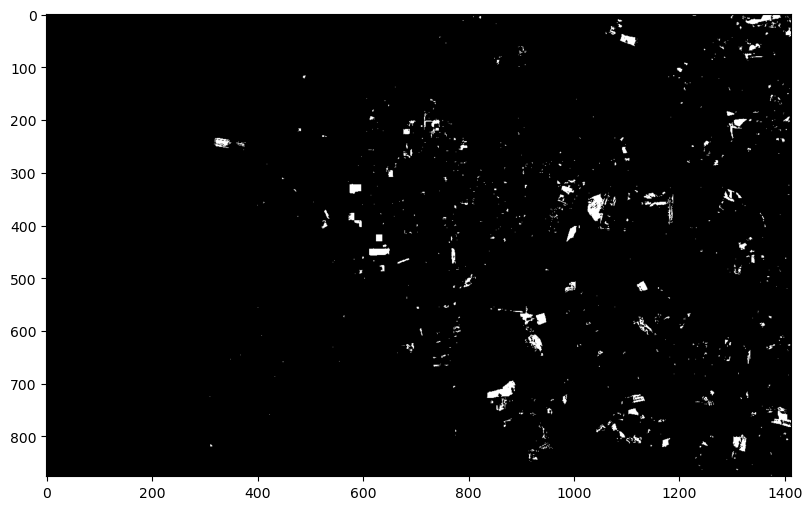

In [114]:
plt.imshow(image_diff< - 0.2 , cmap='binary_r')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


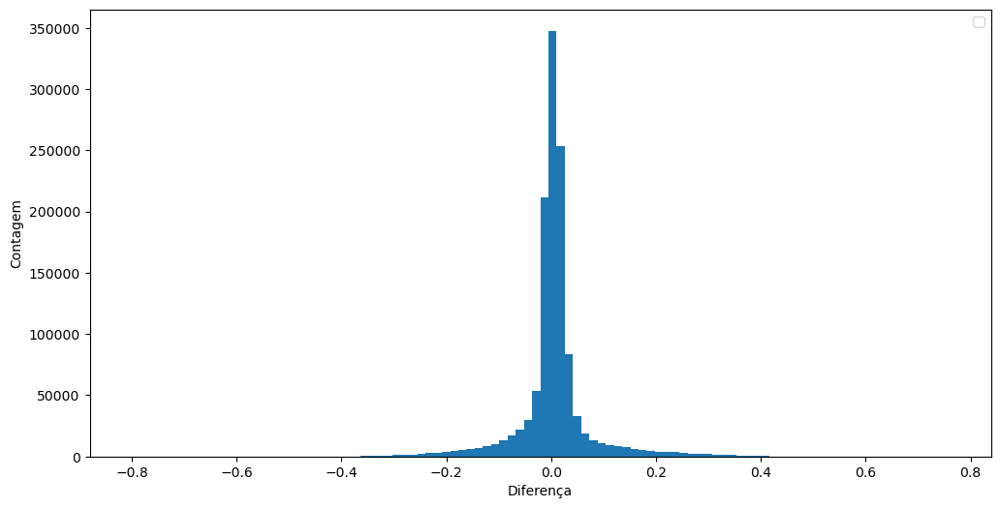

In [109]:
plt.hist(image_diff.ravel(),bins= 100,histtype='stepfilled', label = None)
# Adicionar legendas e títulos
plt.xlabel('Diferença')
plt.ylabel('Contagem')
plt.legend()
plt.show()

In [106]:
std_neg = np.mean(image_diff) - np.std(image_diff)*2
std_pos= np.mean(image_diff) + np.std(image_diff)*2

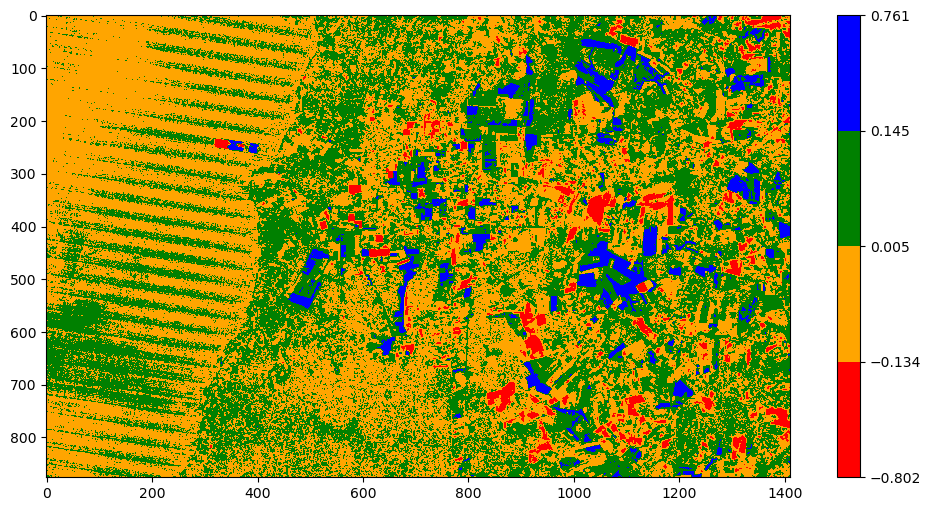

In [107]:
cmap = colors.ListedColormap(['red', 'orange','green','blue'])
bounds=[np.min(image_diff),std_neg,np.mean(image_diff),std_pos,np.max(image_diff)]
norm = colors.BoundaryNorm(bounds, cmap.N)

img = plt.imshow(image_diff,cmap=cmap, norm=norm)

plt.colorbar(img, cmap=cmap, norm=norm, boundaries=bounds, ticks=bounds)

Detecção de mudanças - PCA

In [136]:
stack = np.stack((ndvi_2005, ndvi_2010), axis=0)


In [137]:
stack.shape

(2, 876, 1411)

In [116]:
from sklearn.decomposition import PCA

In [138]:
n_bands, n_height, n_width = stack.shape
img_reshaped = stack.reshape(n_bands, n_height * n_width).T

# Aplicar PCA na imagem
pca = PCA(n_components=n_bands)  # Reduzir para 3 componentes principais
img_pca = pca.fit_transform(img_reshaped)

# Reverter a forma para (3, altura, largura) para visualização e salvamento
img_pca_reshaped = img_pca.T.reshape((n_bands, n_height, n_width))

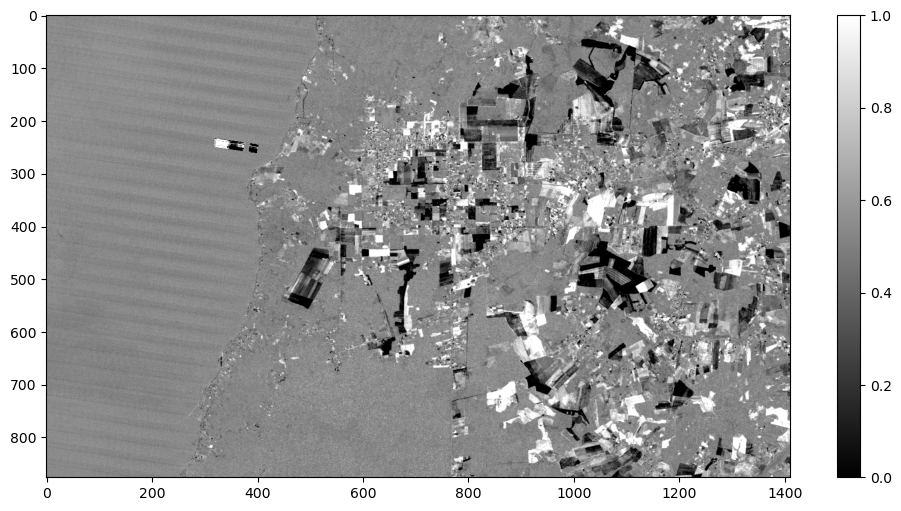

In [144]:
plt.imshow(realce(img_pca_reshaped[1]) , cmap='gray')
plt.colorbar()

In [148]:
final = ndimage.median_filter(img_pca_reshaped[1], size = 3)

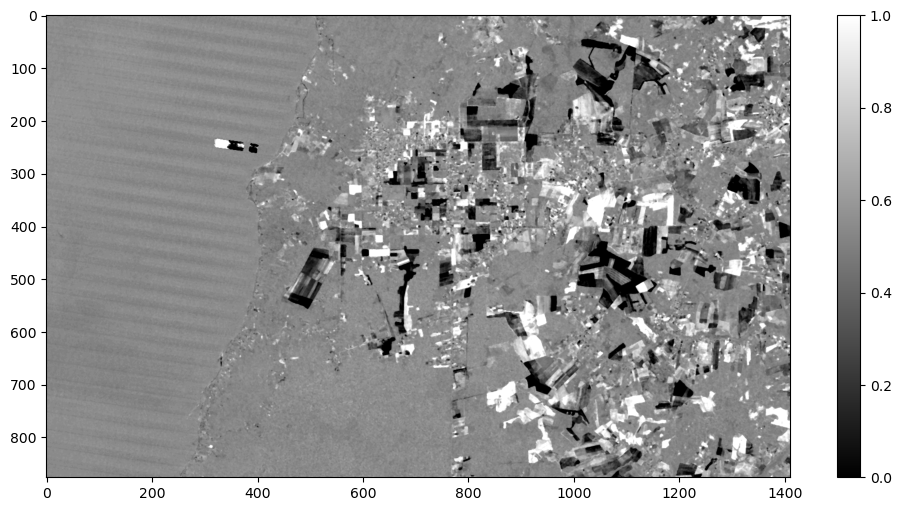

In [149]:
plt.imshow(realce(final) , cmap='gray')
plt.colorbar()

Classificação não-supervisionada k-means

In [150]:
from sklearn.cluster import KMeans
from matplotlib.colors import ListedColormap

In [151]:
n_bands, n_height, n_width = image.shape
img_reshaped = image.reshape(n_bands, n_height * n_width).T

In [157]:
# Definir o número de clusters
k = 3

# Inicializar e ajustar o modelo K-means
kmeans = KMeans(n_clusters=k, random_state=0).fit(img_reshaped)

# Previsões de cluster para cada pixel
labels = kmeans.labels_

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [158]:
# Reestruturar o resultado para o formato original da imagem
clusters = labels.reshape((n_height,n_width))

In [159]:
np.unique(clusters)

array([0, 1, 2])

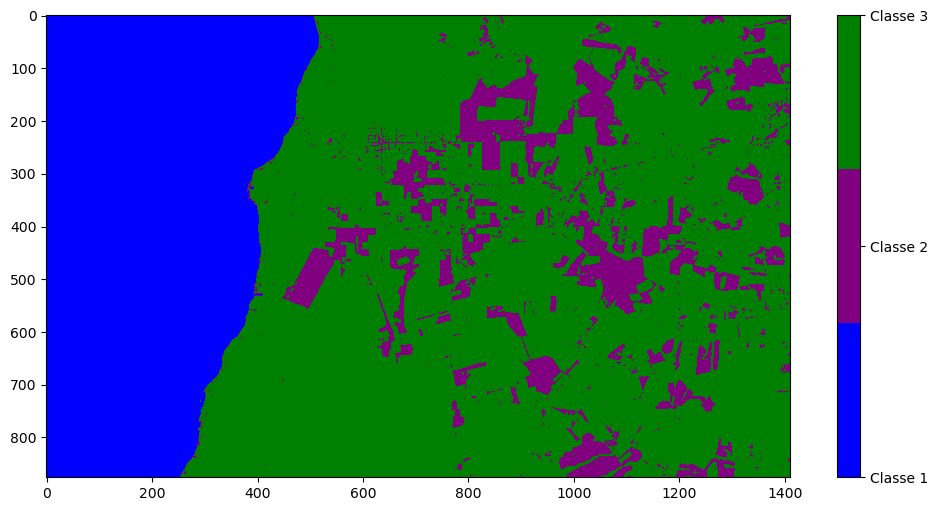

In [164]:
n_classes = len(np.unique(clusters))

cmap = ListedColormap(['blue', 'purple','green'])

plt.figure(figsize=(12, 6))
plt.imshow(clusters, cmap=cmap)

# Criar a barra de cores
cbar = plt.colorbar()
cbar.set_ticks(np.arange(0, 3))
cbar.set_ticklabels(['Classe 1', 'Classe 2', 'Classe 3'])
plt.show()

In [169]:
filtered_clusters_2010 = ndimage.median_filter(clusters, size = 3)


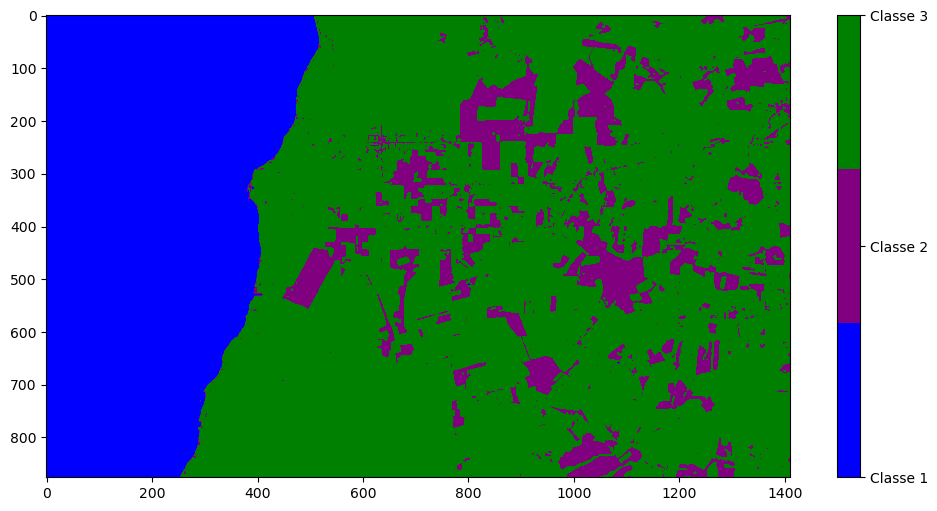

In [171]:

cmap = ListedColormap(['blue', 'purple','green'])

plt.figure(figsize=(12, 6))
plt.imshow(filtered_clusters_2010, cmap=cmap)

# Criar a barra de cores
cbar = plt.colorbar()
cbar.set_ticks(np.arange(0, 3))
cbar.set_ticklabels(['Classe 1', 'Classe 2', 'Classe 3'])
plt.show()

In [172]:
n_bands, n_height, n_width = image.shape
img_reshaped = image2.reshape(n_bands, n_height * n_width).T

In [173]:
# Definir o número de clusters
k = 3

# Inicializar e ajustar o modelo K-means
kmeans = KMeans(n_clusters=k, random_state=0).fit(img_reshaped)

# Previsões de cluster para cada pixel
labels = kmeans.labels_

c:\Users\Gabriel\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [174]:
clusters2 = labels.reshape((n_height,n_width))

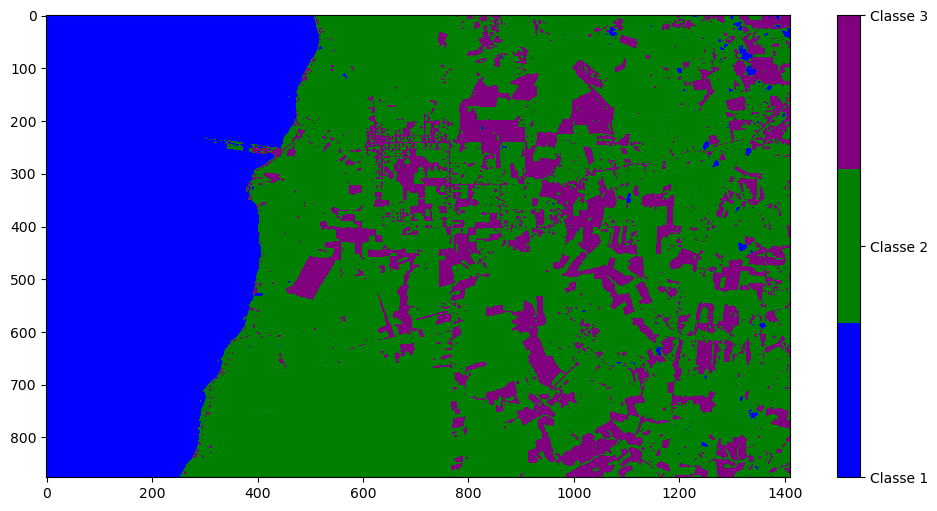

In [176]:
n_classes = len(np.unique(clusters2))

cmap = ListedColormap(['blue','green','purple'])

plt.figure(figsize=(12, 6))
plt.imshow(clusters2, cmap=cmap)

# Criar a barra de cores
cbar = plt.colorbar()
cbar.set_ticks(np.arange(0, 3))
cbar.set_ticklabels(['Classe 1', 'Classe 2', 'Classe 3'])
plt.show()

In [177]:
filtered_clusters_2005 = ndimage.median_filter(clusters2, size = 3)

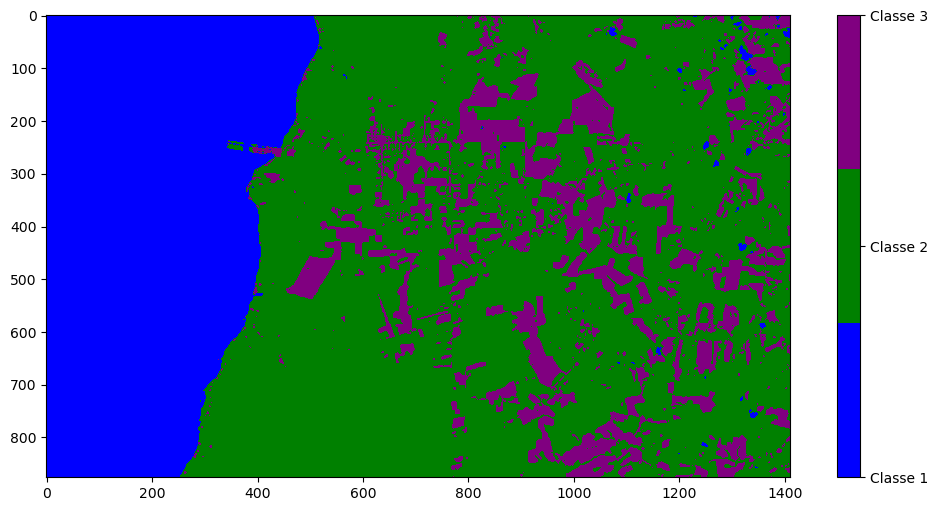

In [178]:
cmap = ListedColormap(['blue','green','purple'])

plt.figure(figsize=(12, 6))
plt.imshow(filtered_clusters_2005, cmap=cmap)

# Criar a barra de cores
cbar = plt.colorbar()
cbar.set_ticks(np.arange(0, 3))
cbar.set_ticklabels(['Classe 1', 'Classe 2', 'Classe 3'])
plt.show()

In [189]:
veg_2005 = (filtered_clusters_2005[:,:]==1)
veg_2010 = (filtered_clusters_2010[:,:]==2)

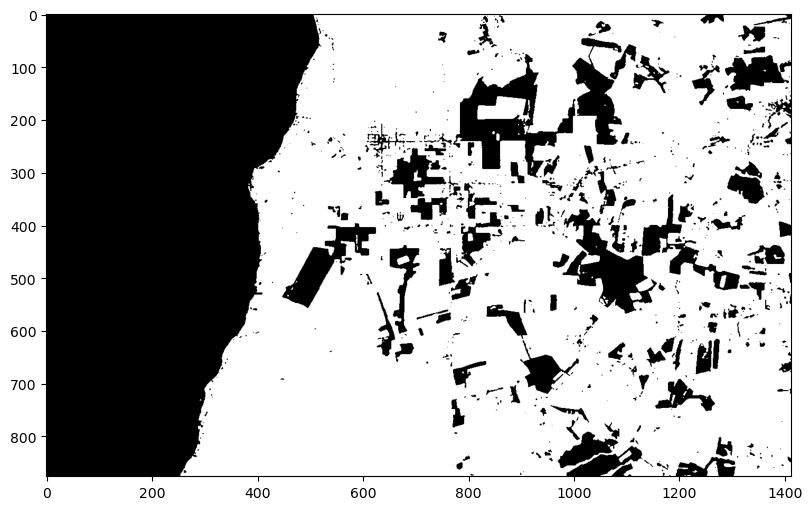

In [190]:
plt.imshow(veg_2005,cmap='binary_r')
plt.imshow(veg_2010,cmap='binary_r')

In [192]:
veg_diff = veg_2010 ^ veg_2005

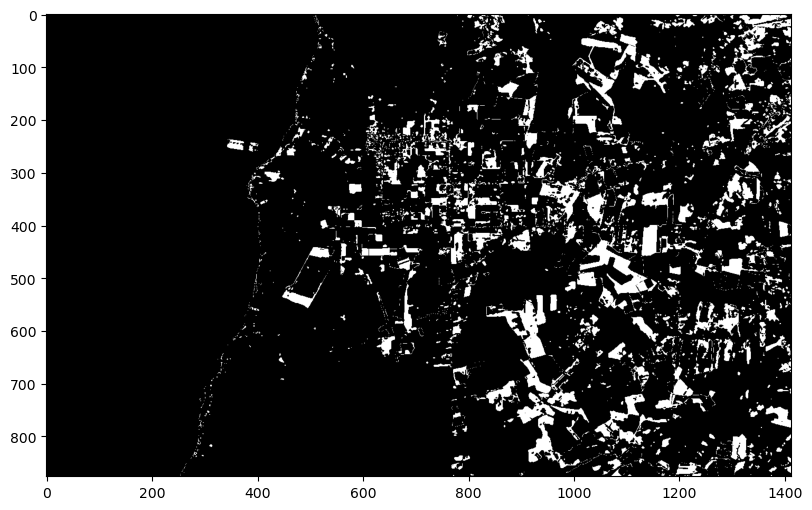

In [193]:
plt.imshow(veg_diff,cmap='binary_r')